In [1]:
import numpy as np
import tensorflow as tf
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from sklearn.model_selection import train_test_split
from pandas.plotting import register_matplotlib_converters

In [13]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
tf.debugging.set_log_device_placement(True)
device = tf.device('/device:gpu:1')
device

Num GPUs Available:  1


In [3]:
RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

In [2]:
df = pd.read_csv('../../eICU/training/finalData.csv')
df

,patientunitstayid,observationoffset,temperature,heartrate,respiration,systemicsystolic,creatinine,wbcx1000,lactate,urineoutputbyweight,diagnosis
0,143870,7.0,37.0,44.0,86.0,111.0,0.89,11.7,1.5,3.870968,0.0
1,143870,10.0,37.0,43.0,80.5,112.5,0.89,11.7,1.5,3.870968,0.0
2,143870,12.0,37.0,42.0,75.0,114.0,0.89,11.7,1.5,3.870968,0.0
3,143870,17.0,37.0,41.0,78.0,113.0,0.89,11.7,1.5,3.870968,0.0
4,143870,22.0,37.0,41.0,73.0,113.0,0.89,11.7,1.5,3.870968,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1230089,3353113,2671.0,37.0,87.0,27.0,120.0,0.57,5.0,1.8,0.852273,0.0
1230090,3353113,2676.0,37.0,85.0,27.0,120.0,0.57,5.0,1.8,0.852273,0.0
1230091,3353113,2681.0,37.0,84.0,26.0,120.0,0.57,5.0,1.8,0.852273,0.0
1230092,3353113,2686.0,37.0,84.0,25.0,120.0,0.57,5.0,1.8,0.852273,0.0


In [3]:
df['diagnosis'].unique()

array([0.        , 1.        , 0.00990099, ..., 0.90322581, 0.93548387,
       0.96774194])

In [5]:
train_size = int(len(df) * 0.8)
test_size = len(df) - train_size
train, test = df.iloc[0:train_size], df.iloc[train_size:len(df)]
print(len(train), len(test))

984075 246019


In [6]:
from sklearn.preprocessing import RobustScaler

f_columns = ['patientunitstayid','temperature', 'heartrate', 'respiration', 'systemicsystolic', 'creatinine', 'wbcx1000', 'lactate', 'urineoutputbyweight']

f_transformer = RobustScaler()
cnt_transformer = RobustScaler()

f_transformer = f_transformer.fit(train[f_columns].to_numpy())
cnt_transformer = cnt_transformer.fit(train[['observationoffset']])

train.loc[:, f_columns] = f_transformer.transform(train[f_columns].to_numpy())
train['observationoffset'] = cnt_transformer.transform(train[['observationoffset']])

test.loc[:, f_columns] = f_transformer.transform(test[f_columns].to_numpy())
test['observationoffset'] = cnt_transformer.transform(test[['observationoffset']])

C:\tools\Anaconda3\lib\site-packages\pandas\core\indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s
C:\tools\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
C:\tools\Anaconda3\lib\site-packages\pandas\core\indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation:

In [7]:
def create_dataset(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps)].values
        Xs.append(v)        
        ys.append(y.iloc[i + time_steps])
    return np.array(Xs), np.array(ys)

In [8]:
time_steps = 10

# reshape to [samples, time_steps, n_features]

X_train, y_train = create_dataset(train, train.observationoffset, time_steps)
X_test, y_test = create_dataset(test, test.observationoffset, time_steps)

print(X_train.shape, y_train.shape)

(984065, 10, 11) (984065,)


In [9]:
model = tf.keras.Sequential()
model.add(
  tf.keras.layers.Bidirectional(
    tf.keras.layers.LSTM(
      units=128, 
      input_shape=(X_train.shape[1], X_train.shape[2])
    )
  )
)
model.add(tf.keras.layers.Dropout(rate=0.2))
model.add(tf.keras.layers.Dense(units=1))
model.compile(loss='mean_squared_error', optimizer='adam')

In [10]:
history = model.fit(
    X_train, y_train, 
    epochs=30, 
    batch_size=32, 
    validation_split=0.1,
    shuffle=False
)

Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomStandardNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Qr in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DiagPart in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sign in device /job:localhost/replica:0/task:0

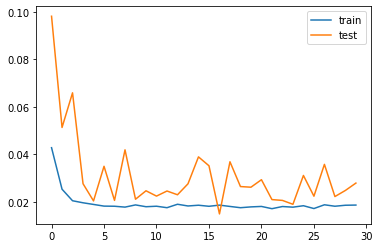

In [11]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend();